<a href="https://colab.research.google.com/github/muhamrii/JakartaAirQuality_AdaptivePredictionAI/blob/main/AirQualityPrediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Install required libraries
!pip install tensorflow pandas matplotlib requests scikit-learn folium

In [2]:
# Import required modules
import random
import pandas as pd
import requests
import time
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt


In [3]:
# ============================
# STEP 1: Simulated IoT Sensor Site Creation
# ============================

# Famous locations in Jakarta (Latitude, Longitude)
locations = [
    {"name": "Monas", "lat": -6.1751, "lon": 106.8271},
    {"name": "Gelora Bung Karno Stadium", "lat": -6.2182, "lon": 106.8018},
    {"name": "Kota Tua Jakarta", "lat": -6.1352, "lon": 106.8133},
    {"name": "Ancol Dreamland", "lat": -6.1256, "lon": 106.8366},
    {"name": "Bundaran HI", "lat": -6.1959, "lon": 106.8227},
    {"name": "Ragunan Zoo", "lat": -6.3036, "lon": 106.8196},
    {"name": "Taman Mini Indonesia Indah", "lat": -6.3025, "lon": 106.8956},
    {"name": "Soekarno-Hatta Airport", "lat": -6.1256, "lon": 106.6559},
    {"name": "Sudirman CBD", "lat": -6.2244, "lon": 106.8091},
    {"name": "Pasar Baru", "lat": -6.168, "lon": 106.8315},
    {"name": "Jakarta International Stadium", "lat": -6.1269, "lon": 106.8776},
    {"name": "Senayan City", "lat": -6.2252, "lon": 106.7972},
    {"name": "Pluit Village Mall", "lat": -6.123, "lon": 106.7792},
    {"name": "Kemang Village", "lat": -6.264, "lon": 106.8131},
    {"name": "Pantai Indah Kapuk", "lat": -6.1182, "lon": 106.75},
    {"name": "Grand Indonesia Mall", "lat": -6.1961, "lon": 106.8228},
    {"name": "Ciputra World Jakarta", "lat": -6.224, "lon": 106.8225},
    {"name": "Mangga Dua Square", "lat": -6.1383, "lon": 106.8282},
    {"name": "Blok M Plaza", "lat": -6.2437, "lon": 106.8008},
    {"name": "Senayan Park", "lat": -6.2261, "lon": 106.7975},
    {"name": "Pondok Indah Mall", "lat": -6.2628, "lon": 106.7821},
    {"name": "Cilandak Town Square", "lat": -6.2895, "lon": 106.7973},
    {"name": "Kelapa Gading Mall", "lat": -6.1558, "lon": 106.9077},
    {"name": "FX Sudirman", "lat": -6.2245, "lon": 106.8076},
    {"name": "Central Park Mall", "lat": -6.1768, "lon": 106.7903},
    {"name": "Pasar Minggu", "lat": -6.2931, "lon": 106.8506},
    {"name": "Grogol Petamburan", "lat": -6.1751, "lon": 106.7959},
    {"name": "Jakarta Kota Station", "lat": -6.1375, "lon": 106.8142},
    {"name": "Pejaten Village", "lat": -6.2764, "lon": 106.8358},
    {"name": "Muara Angke Fish Market", "lat": -6.1166, "lon": 106.7797},
    {"name": "Tebet Green Park", "lat": -6.2318, "lon": 106.8526},
    {"name": "Artha Gading Mall", "lat": -6.1541, "lon": 106.9058},
    {"name": "Kalibata City Square", "lat": -6.2573, "lon": 106.8474},
    {"name": "Gandaria City Mall", "lat": -6.2448, "lon": 106.7821},
    {"name": "Kuningan City Mall", "lat": -6.2274, "lon": 106.8327},
    {"name": "Menteng Park", "lat": -6.1973, "lon": 106.8332},
    {"name": "East Jakarta Industrial Park", "lat": -6.2676, "lon": 106.9632},
    {"name": "Sunter Mall", "lat": -6.1553, "lon": 106.8779},
    {"name": "Halim Perdanakusuma Airport", "lat": -6.2666, "lon": 106.889},
    {"name": "Thamrin City Mall", "lat": -6.1949, "lon": 106.808},
    {"name": "PIK Golf Island", "lat": -6.1173, "lon": 106.7449},
    {"name": "Marunda", "lat": -6.1145, "lon": 106.9462},
    {"name": "Cibubur Junction", "lat": -6.3671, "lon": 106.8827},
    {"name": "Mall Taman Anggrek", "lat": -6.1762, "lon": 106.792},
    {"name": "Cipinang Indah Mall", "lat": -6.2331, "lon": 106.9003},
    {"name": "Green Pramuka City", "lat": -6.1866, "lon": 106.8793},
    {"name": "Mega Kuningan", "lat": -6.2248, "lon": 106.8285},
    {"name": "Pulo Gadung Industrial Area", "lat": -6.1903, "lon": 106.8987},
    {"name": "Tamansari Hive", "lat": -6.1838, "lon": 106.8869},
    {"name": "Ciputra Mall Cibubur", "lat": -6.3821, "lon": 106.8725}
]

# Using the full list of 50 locations for sequential assignment
site_data = []

# Loop through all 50 locations
for i, location in enumerate(locations):
    site_data.append({
        "Site_ID": f"Site_{i + 1}",
        "Location_Name": location["name"],
        "Latitude": location["lat"],
        "Longitude": location["lon"],
    })

# Convert to DataFrame
site_df = pd.DataFrame(site_data)

# Display the first few entries
site_df.head(), site_df.shape

print("Simulated IoT Sensor Locations:")
print(site_df)


Simulated IoT Sensor Locations:
    Site_ID                  Location_Name  Latitude  Longitude
0    Site_1                          Monas   -6.1751   106.8271
1    Site_2      Gelora Bung Karno Stadium   -6.2182   106.8018
2    Site_3               Kota Tua Jakarta   -6.1352   106.8133
3    Site_4                Ancol Dreamland   -6.1256   106.8366
4    Site_5                    Bundaran HI   -6.1959   106.8227
5    Site_6                    Ragunan Zoo   -6.3036   106.8196
6    Site_7     Taman Mini Indonesia Indah   -6.3025   106.8956
7    Site_8         Soekarno-Hatta Airport   -6.1256   106.6559
8    Site_9                   Sudirman CBD   -6.2244   106.8091
9   Site_10                     Pasar Baru   -6.1680   106.8315
10  Site_11  Jakarta International Stadium   -6.1269   106.8776
11  Site_12                   Senayan City   -6.2252   106.7972
12  Site_13             Pluit Village Mall   -6.1230   106.7792
13  Site_14                 Kemang Village   -6.2640   106.8131
14  Site

In [5]:
!pip install googlemaps

  Preparing metadata (setup.py) ... done
  Created wheel for googlemaps: filename=googlemaps-4.10.0-py3-none-any.whl size=40715 sha256=4fb17120847c3fbfd6596a01a20be8dbb8892f8f91133fd86b3d941059d1ba9c
  Stored in directory: /root/.cache/pip/wheels/17/f8/79/999d5d37118fd35d7219ef57933eb9d09886c4c4503a800f84
Successfully built googlemaps


In [6]:
# ============================
# STEP 2: Data Collection
# ============================
from google.colab import userdata
from datetime import datetime, timedelta
import googlemaps
import requests
import pandas as pd
import time

# Replace with your API keys
GOOGLE_MAPS_API_KEY = userdata.get('MAPS_API')
OPEN_METEO_URL = "https://api.open-meteo.com/v1/forecast"

# Initialize Google Maps API client
gmaps = googlemaps.Client(key=GOOGLE_MAPS_API_KEY)

# Fetch traffic data
def fetch_traffic_data(lat, lon, date_time):
    makefuturedata = date_time + timedelta(days=9)
    utc_datetime = makefuturedata - timedelta(hours=7)  # Convert Bangkok time to UTC
    departure_time = int(utc_datetime.timestamp())

    origins = [(lat, lon)]
    destinations = [(lat + 0.01, lon + 0.01)]

    try:
        response = gmaps.distance_matrix(
            origins, destinations, mode="driving", departure_time=departure_time
        )
        traffic_data = response["rows"][0]["elements"][0]
        return {
            "travel_time_seconds": traffic_data["duration_in_traffic"]["value"],
            "free_flow_time_seconds": traffic_data["duration"]["value"],
            "traffic_status": traffic_data["status"]
        }

    except googlemaps.exceptions.ApiError as e:
        print(f"Error fetching traffic data: {e}")
        return {
            "travel_time_seconds": None,
            "free_flow_time_seconds": None,
            "traffic_status": "API_ERROR"
        }

# Fetch weather data (optimized)
def fetch_weather_data(lat, lon, start_date, end_date):
    params = {
        "latitude": lat,
        "longitude": lon,
        "hourly": "temperature_2m,relative_humidity_2m,precipitation,wind_speed_10m",
        "start_date": start_date.strftime("%Y-%m-%d"),
        "end_date": end_date.strftime("%Y-%m-%d"),
        "timezone": "Asia/Bangkok"
    }

    try:
        response = requests.get(OPEN_METEO_URL, params=params)
        response.raise_for_status()
        data = response.json()
        return data["hourly"]

    except requests.exceptions.RequestException as e:
        print(f"Error fetching weather data: {e}")
        return None

# Fetch air quality data
def fetch_air_quality_data(latitude, longitude, date_time):
    url = "https://airquality.googleapis.com/v1/history:lookup"
    headers = {"Content-Type": "application/json"}
    utc_datetime = date_time - timedelta(hours=7)
    payload = {
        "dateTime": utc_datetime.isoformat() + "Z",
        "location": {
            "latitude": latitude,
            "longitude": longitude
        }
    }

    try:
        response = requests.post(url, headers=headers, json=payload, params={"key": GOOGLE_MAPS_API_KEY})
        response.raise_for_status()
        data = response.json()
        hours_info = data.get("hoursInfo", [])
        if not hours_info:
            return None

        first_hour_info = hours_info[0]
        indexes = first_hour_info.get("indexes", [])
        if not indexes:
            return None

        first_index = indexes[0]
        return {
            "valid_timestamp": first_hour_info["dateTime"],
            "aqi": first_index["aqi"],
            "category": first_index["category"],
            "dominantPollutant": first_index["dominantPollutant"]
        }

    except requests.exceptions.RequestException as e:
        print(f"Error fetching air quality data: {e}")
        return None

# Generate date range
end_date = datetime.now() - timedelta(days=1)
start_date = end_date - timedelta(days=7)
date_range = [start_date + timedelta(hours=x) for x in range(0, (7 * 24))]

# Collect data for all sites
all_data = []
for _, site in site_df.iterrows():
    # Fetch weather data once per site
    weather_data = fetch_weather_data(site["Latitude"], site["Longitude"], start_date, end_date)
    if not weather_data:
        continue

    for date_time in date_range:
        hour_index = date_time.hour
        traffic_data = fetch_traffic_data(site["Latitude"], site["Longitude"], date_time)
        air_quality_data = fetch_air_quality_data(site["Latitude"], site["Longitude"], date_time)

        site_data = {
            **site.to_dict(),
            "valid_timestamp": date_time,
            "temperature_2m": weather_data["temperature_2m"][hour_index],
            "relative_humidity_2m": weather_data["relative_humidity_2m"][hour_index],
            "wind_speed_10m": weather_data["wind_speed_10m"][hour_index],
            "precipitation": weather_data["precipitation"][hour_index],
            **traffic_data,
            **(air_quality_data if air_quality_data else {})
        }
        print(site_data)
        all_data.append(site_data)

# Create a DataFrame
data_df = pd.DataFrame(all_data)

print("Collected Data for 7 Days (Hourly):")
data_df.to_csv('data_final.csv', index=False)
print(data_df)


Streaming output truncated to the last 5000 lines.
{'Site_ID': 'Site_21', 'Location_Name': 'Pondok Indah Mall', 'Latitude': -6.2628, 'Longitude': 106.7821, 'valid_timestamp': '2024-12-09T11:00:00Z', 'temperature_2m': 26.2, 'relative_humidity_2m': 89, 'wind_speed_10m': 6.9, 'precipitation': 0.1, 'travel_time_seconds': 668, 'free_flow_time_seconds': 596, 'traffic_status': 'OK', 'aqi': 60, 'category': 'Good air quality', 'dominantPollutant': 'pm25'}
{'Site_ID': 'Site_21', 'Location_Name': 'Pondok Indah Mall', 'Latitude': -6.2628, 'Longitude': 106.7821, 'valid_timestamp': '2024-12-09T12:00:00Z', 'temperature_2m': 26.2, 'relative_humidity_2m': 91, 'wind_speed_10m': 5.8, 'precipitation': 0.0, 'travel_time_seconds': 647, 'free_flow_time_seconds': 596, 'traffic_status': 'OK', 'aqi': 57, 'category': 'Moderate air quality', 'dominantPollutant': 'no2'}
{'Site_ID': 'Site_21', 'Location_Name': 'Pondok Indah Mall', 'Latitude': -6.2628, 'Longitude': 106.7821, 'valid_timestamp': '2024-12-09T13:00:00Z'

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Load dataset
data_df = pd.read_csv('data_final.csv')

# Preprocessing
# Handle missing values (fill or drop depending on strategy)
data_df = data_df.dropna()

# Normalize numerical features
scaler = MinMaxScaler()
numeric_columns = ["temperature_2m", "relative_humidity_2m", "wind_speed_10m", "precipitation", "travel_time_seconds", "free_flow_time_seconds", "aqi"]
data_df[numeric_columns] = scaler.fit_transform(data_df[numeric_columns])

# Encode categorical label (air quality category)
label_encoder = LabelEncoder()
data_df['category_encoded'] = label_encoder.fit_transform(data_df['category'])

# Feature selection and target
features = numeric_columns
X = data_df[features].values
y_aqi = data_df['aqi'].values  # Target for regression
y_category = data_df['category_encoded'].values  # Target for classification

# Reshape for LSTM (samples, timesteps, features)
sequence_length = 24  # Using 24 hours as a sequence
X_sequences, y_aqi_sequences, y_category_sequences = [], [], []
for i in range(len(X) - sequence_length):
    X_sequences.append(X[i:i+sequence_length])
    y_aqi_sequences.append(y_aqi[i+sequence_length])
    y_category_sequences.append(y_category[i+sequence_length])

X_sequences = np.array(X_sequences)
y_aqi_sequences = np.array(y_aqi_sequences)
y_category_sequences = np.array(y_category_sequences)

# Split into train and test sets
X_train, X_test, y_aqi_train, y_aqi_test = train_test_split(X_sequences, y_aqi_sequences, test_size=0.2, random_state=42)
_, _, y_category_train, y_category_test = train_test_split(X_sequences, y_category_sequences, test_size=0.2, random_state=42)

# Build LSTM model for AQI prediction
model_aqi = Sequential([
    LSTM(64, return_sequences=True, input_shape=(sequence_length, len(features))),
    Dropout(0.2),
    LSTM(64),
    Dropout(0.2),
    Dense(1)  # Regression output
])

model_aqi.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
model_aqi.fit(X_train, y_aqi_train, epochs=20, batch_size=32, validation_split=0.2)

# Evaluate AQI model
loss, mae = model_aqi.evaluate(X_test, y_aqi_test)
print(f"AQI Prediction - Loss: {loss}, MAE: {mae}")

# Build LSTM model for Air Quality Category prediction
model_category = Sequential([
    LSTM(64, return_sequences=True, input_shape=(sequence_length, len(features))),
    Dropout(0.2),
    LSTM(64),
    Dropout(0.2),
    Dense(len(np.unique(y_category)), activation='softmax')  # Classification output
])

model_category.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_category.fit(X_train, y_category_train, epochs=20, batch_size=32, validation_split=0.2)

# Evaluate Category model
loss, accuracy = model_category.evaluate(X_test, y_category_test)
print(f"Category Prediction - Loss: {loss}, Accuracy: {accuracy}")


Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


168/168 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.0447 - mae: 0.1617 - val_loss: 0.0156 - val_mae: 0.0989
Epoch 2/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0187 - mae: 0.1089 - val_loss: 0.0122 - val_mae: 0.0880
Epoch 3/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0149 - mae: 0.0961 - val_loss: 0.0087 - val_mae: 0.0704
Epoch 4/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0120 - mae: 0.0849 - val_loss: 0.0075 - val_mae: 0.0651
Epoch 5/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0104 - mae: 0.0789 - val_loss: 0.0064 - val_mae: 0.0589
Epoch 6/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0093 - mae: 0.0745 - val_loss: 0.0063 - val_mae: 0.0605
Epoch 7/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.0089 - mae: 0.0720 - val_loss: 0.0060 - val_mae: 0.0569
Epoch 8/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0086 - mae: 0.0706 - val_loss: 0.0063 - val_mae: 0.0599
Epoch 9/20
168/168 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - los

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
Predicted AQI (original scale): [86.02792239]
Predicted Category: ['Excellent air quality']
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


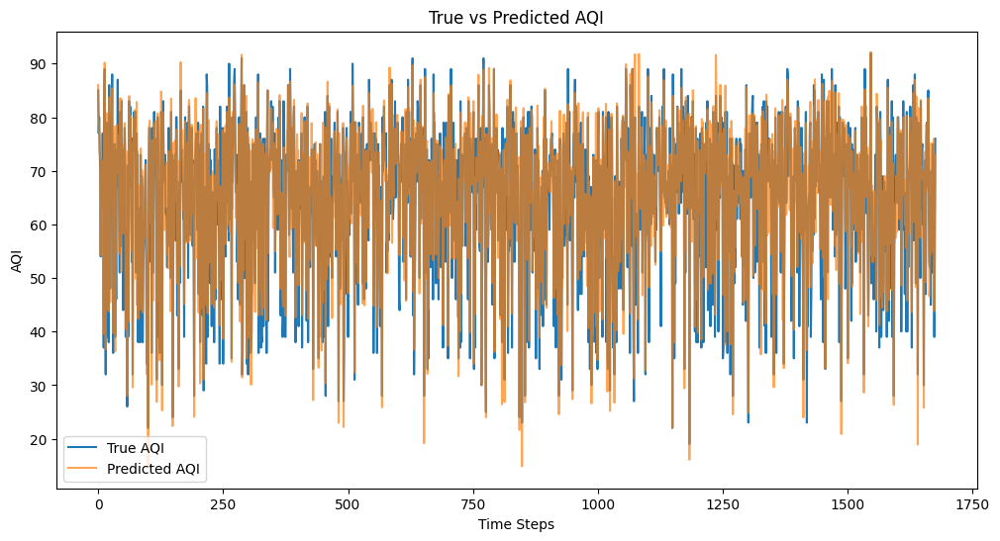

53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


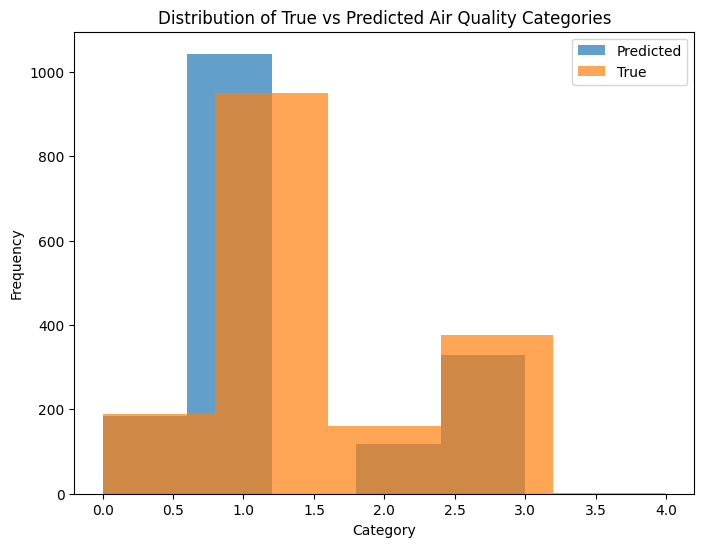

In [8]:

# Save models
model_aqi.save('lstm_aqi_model.h5')
model_category.save('lstm_category_model.h5')

# Inverse transform AQI predictions for interpretation
def inverse_transform_aqi(predictions):
    # Create a dummy array with the same number of features as the scaler expects
    dummy_array = np.zeros((predictions.shape[0], len(numeric_columns)))
    dummy_array[:, -1] = predictions.flatten()  # Place predictions in the AQI column
    return scaler.inverse_transform(dummy_array)[:, -1]  # Inverse transform and extract AQI column

# Example prediction
example_input = X_test[:1]
predicted_aqi = model_aqi.predict(example_input)
predicted_category = model_category.predict(example_input)

# Inverse transform AQI predictions
predicted_aqi_original_scale = inverse_transform_aqi(predicted_aqi)

print("Predicted AQI (original scale):", predicted_aqi_original_scale)
print("Predicted Category:", label_encoder.inverse_transform(np.argmax(predicted_category, axis=1)))

# Visualization of Results
# Plot true vs predicted AQI
predicted_aqi_test = model_aqi.predict(X_test)
true_aqi_test = scaler.inverse_transform(np.hstack([np.zeros((y_aqi_test.shape[0], len(numeric_columns) - 1)),
                                                    y_aqi_test.reshape(-1, 1)]))[:, -1]
predicted_aqi_test = inverse_transform_aqi(predicted_aqi_test)

plt.figure(figsize=(12, 6))
plt.plot(true_aqi_test, label="True AQI")
plt.plot(predicted_aqi_test, label="Predicted AQI", alpha=0.7)
plt.title("True vs Predicted AQI")
plt.xlabel("Time Steps")
plt.ylabel("AQI")
plt.legend()
plt.show()


# Plot Category Prediction Accuracy
predicted_category_test = model_category.predict(X_test)
predicted_category_labels = np.argmax(predicted_category_test, axis=1)

plt.figure(figsize=(8, 6))
plt.hist(predicted_category_labels, bins=len(np.unique(y_category)), alpha=0.7, label="Predicted")
plt.hist(y_category_test, bins=len(np.unique(y_category)), alpha=0.7, label="True")
plt.title("Distribution of True vs Predicted Air Quality Categories")
plt.xlabel("Category")
plt.ylabel("Frequency")
plt.legend()
plt.show()


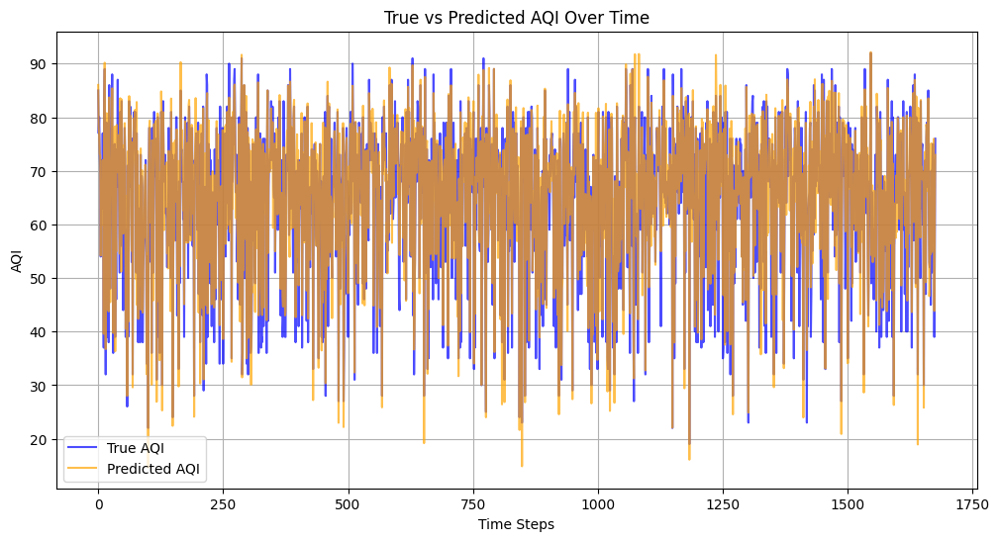

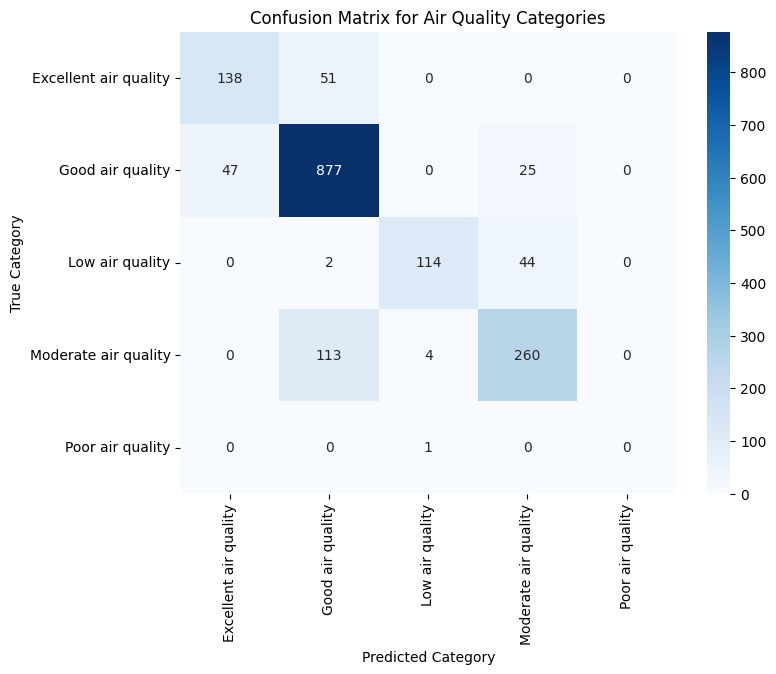

In [9]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import folium

# Time Series Visualization of AQI Predictions
plt.figure(figsize=(12, 6))
plt.plot(true_aqi_test, label="True AQI", alpha=0.7, color='blue')
plt.plot(predicted_aqi_test, label="Predicted AQI", alpha=0.7, color='orange')
plt.title("True vs Predicted AQI Over Time")
plt.xlabel("Time Steps")
plt.ylabel("AQI")
plt.legend()
plt.grid()
plt.show()

# Confusion Matrix for Category Prediction
cm = confusion_matrix(y_category_test, predicted_category_labels)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title("Confusion Matrix for Air Quality Categories")
plt.xlabel("Predicted Category")
plt.ylabel("True Category")
plt.show()



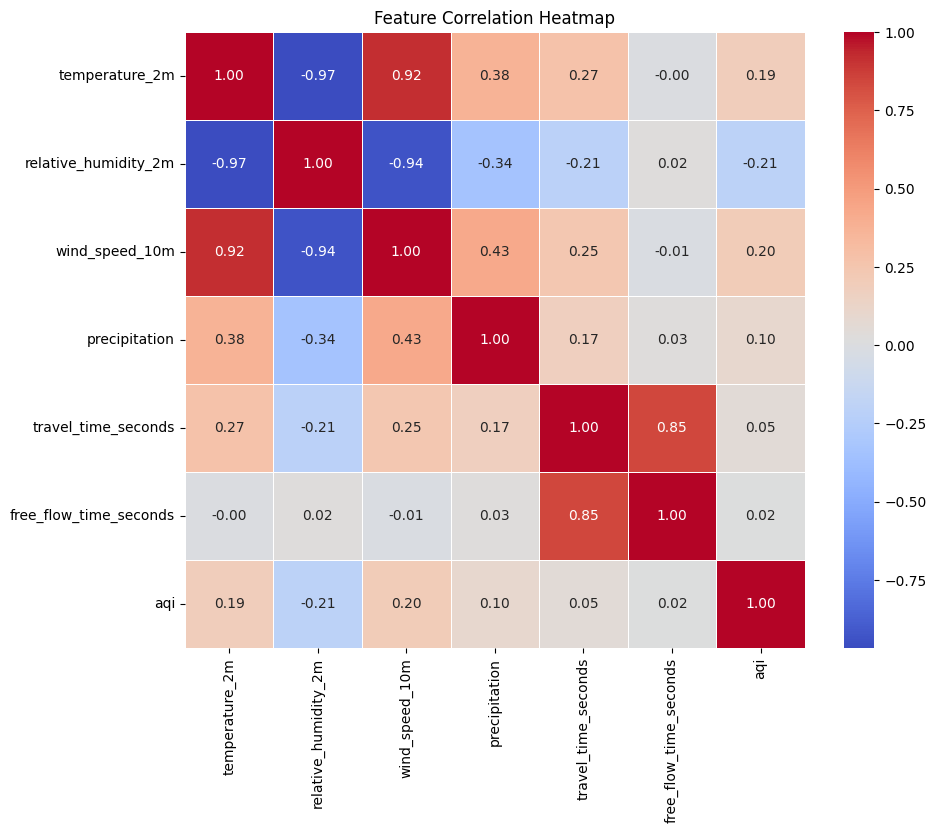

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Figure size 1200x600 with 0 Axes>

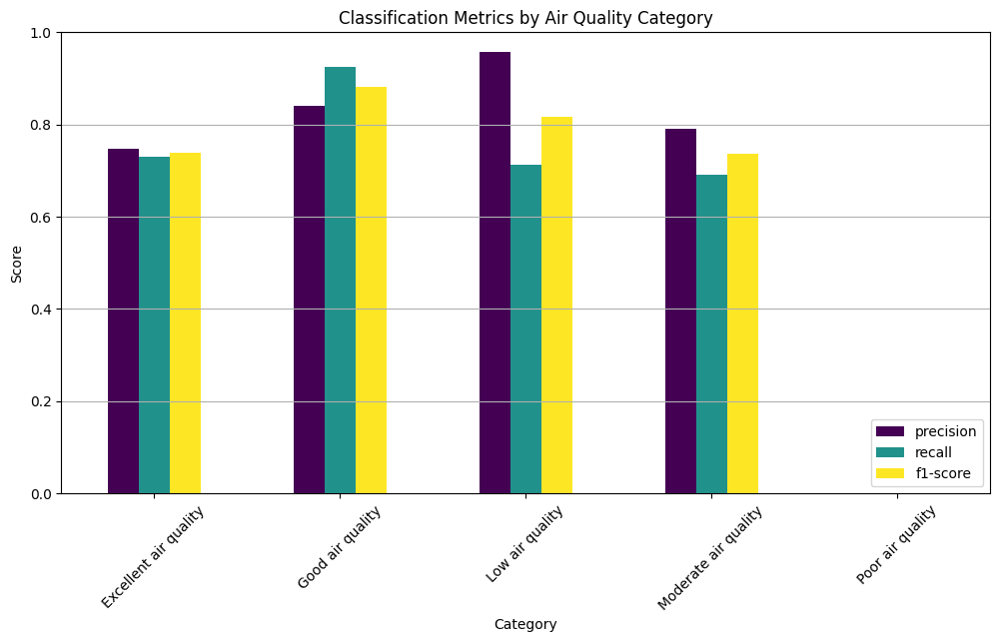

Classification Report:
                       precision    recall  f1-score   support

Excellent air quality       0.75      0.73      0.74       189
     Good air quality       0.84      0.92      0.88       949
      Low air quality       0.96      0.71      0.82       160
 Moderate air quality       0.79      0.69      0.74       377
     Poor air quality       0.00      0.00      0.00         1

             accuracy                           0.83      1676
            macro avg       0.67      0.61      0.63      1676
         weighted avg       0.83      0.83      0.83      1676



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [10]:
# Correlation Heatmap
plt.figure(figsize=(10, 8))
correlation_matrix = data_df[numeric_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

# Detailed Category Prediction Visualization
# Classification Report as Text
report = classification_report(y_category_test, predicted_category_labels, target_names=label_encoder.classes_, output_dict=True)
report_df = pd.DataFrame(report).transpose()

# Plot classification report metrics
plt.figure(figsize=(12, 6))
report_df[:-3][['precision', 'recall', 'f1-score']].plot(kind='bar', figsize=(12, 6), colormap='viridis', rot=45)
plt.title("Classification Metrics by Air Quality Category")
plt.xlabel("Category")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.grid(axis="y")
plt.legend(loc="lower right")
plt.show()
# Print Classification Report
print("Classification Report:")
print(classification_report(y_category_test, predicted_category_labels, target_names=label_encoder.classes_))


In [11]:
import folium
from folium.plugins import MarkerCluster

# Load dataset
data_df = pd.read_csv('data_final.csv')

# Initialize map centered at the mean latitude and longitude
center_lat = data_df["Latitude"].mean()
center_lon = data_df["Longitude"].mean()
map_visualization = folium.Map(location=[center_lat, center_lon], zoom_start=10)

# Add marker cluster to display all points
marker_cluster = MarkerCluster().add_to(map_visualization)

# Plot each location
for _, row in data_df.iterrows():
    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=f"Site: {row['Site_ID']}, AQI: {row['aqi']}, Category: {row['category']}"
    ).add_to(marker_cluster)

# Display map
map_visualization.save('map_visualization.html')

map_visualization
